https://github.com/ctsuu/Advanced-Lane-Finding/blob/master/Advanced-Lane-Finding-Subimission.ipynb

In [7]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
#from moviepy.editor import VideoFileClip
%matplotlib inline

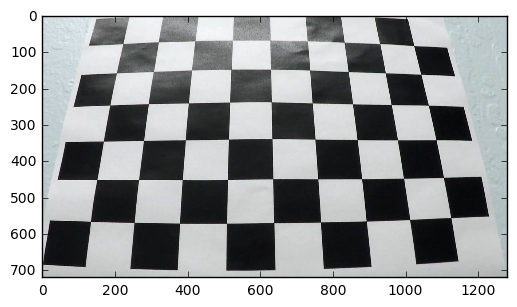

In [8]:
# load chessboard images
fname = 'camera_cal/calibration3.jpg'
img= cv2.imread(fname)
#img = cv2.resize(img,(int(cols*scale),int(rows*scale)))
plt.imshow(img)

In [9]:
# setup
scale = 720/1280 # Scale the 1280 image down to 720 image
nx = 9 # the number of inside corners
ny = 6 # the number of inside corners

[ 8.  5.  0.] [ 0.  5.  0.] [ 0.  0.  0.] [ 8.  0.  0.]


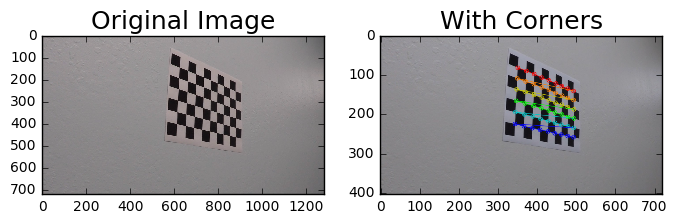

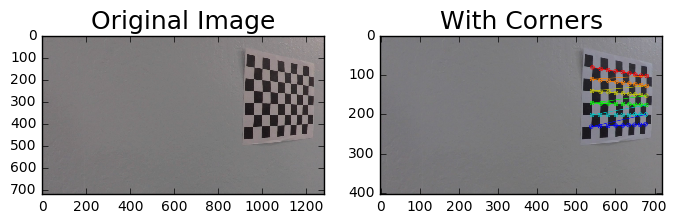

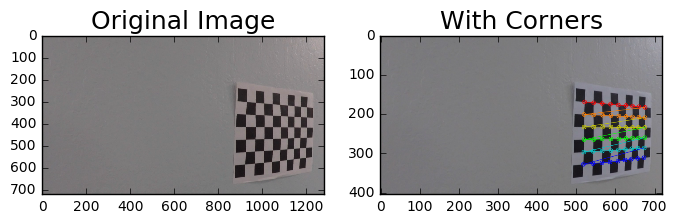

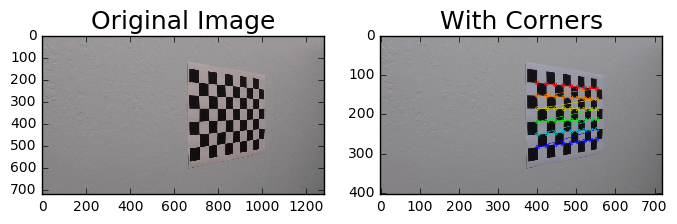

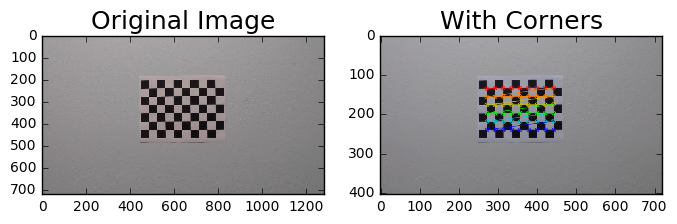

...

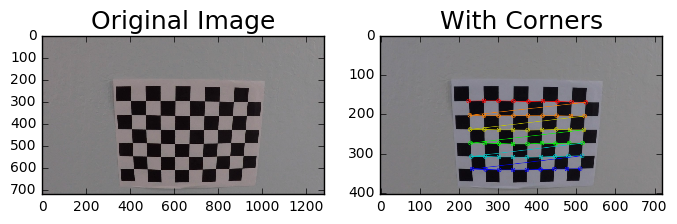

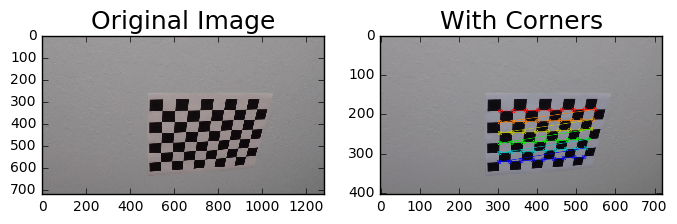

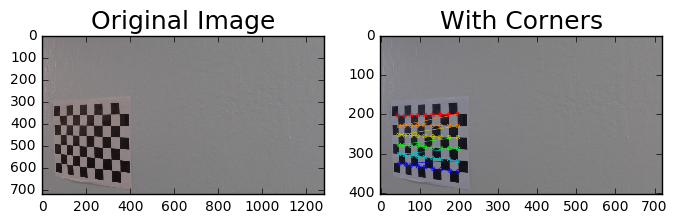

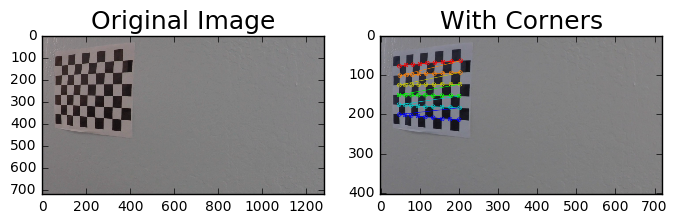

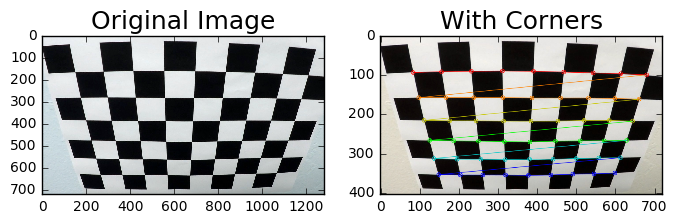

In [10]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

print(objp[-1], objp[-nx], objp[0], objp[nx-1])

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/cal*.jpg')


# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    rows,cols,chs = img.shape
    img = cv2.resize(img,(int(cols*scale),int(rows*scale)))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        """# Draw and display the corners
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
        cv2.waitKey(500)"""
        
        #Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
        ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image', fontsize=18)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('With Corners', fontsize=18)
#cv2.destroyAllWindows()

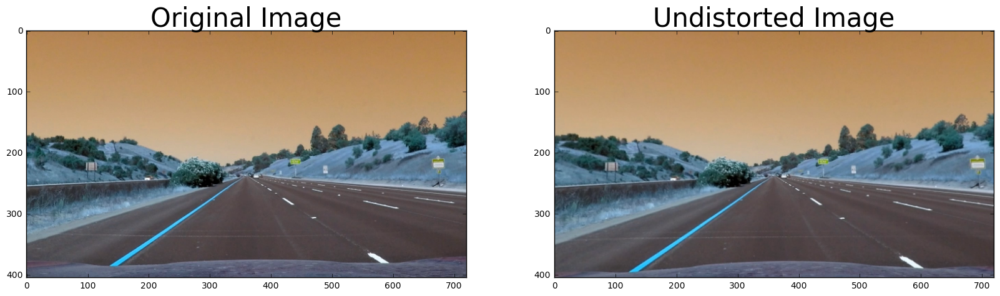

In [11]:
import pickle
%matplotlib inline
# Remove distortion from images
img = cv2.imread('test_images/straight_lines1.jpg')
img = cv2.resize(img,(720,405))
img_size = (img.shape[1], img.shape[0])
# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('calibration_wide/test_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "wide_dist_pickle.p", "wb" ) )

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

In [12]:
# Read in an image and grayscale it
#image = mpimg.imread('signs_vehicles_xygrad.png')

# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
 
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
        # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    grad_binary = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return grad_binary

# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 5) Create a binary mask where mag thresholds are met
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    #return binary_output
     # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=15, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    #return binary_output
        # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output
# add_thresholds and return a binary image

# Define a function that thresholds the S-channel of HLS
def HLS_single(img, thresh=(0, 255)):
    img = np.copy(img)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

# apply a mask on the region of interest
def region_of_interest(img,vertices):
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 1
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [13]:
image = cv2.imread('test_images/test1.jpg')

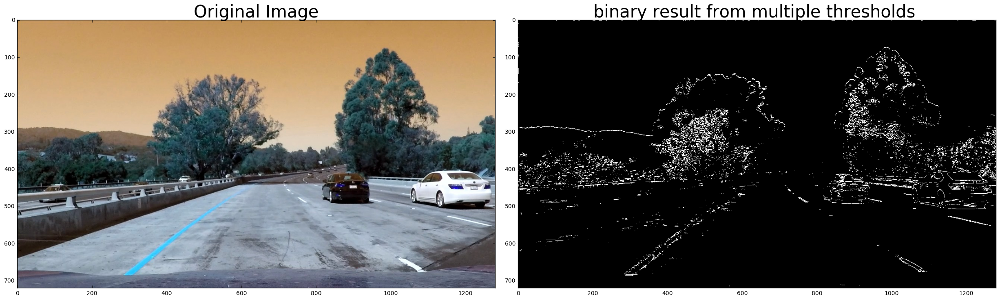

In [14]:
#image = cv2.resize(image,(720,405))
#gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements
     
# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(10,90))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(10,90))
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(80,255))
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))
hls_binary = HLS_single(image, thresh=(70, 255))
combined = np.zeros_like(dir_binary)
#combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
combined[((grady == 1) & (grady == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1) & (hls_binary == 1))] = 1
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(combined, cmap='gray')
ax2.set_title('binary result from multiple thresholds ', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [15]:
# Test if the region of interest works
img = cv2.imread('test_images/test1.jpg')
#img= mpimg.imread('test_images/test2.jpg')
img = cv2.resize(img,(720,405))
img_x = img.shape[1]
img_y = img.shape[0]

# select mask region
vertices = np.array([[(0.14*img_x,img_y),(0.443*img_x, 0.63*img_y),
                          (0.56*img_x, 0.63*img_y), (0.9*img_x,img_y)]], dtype=np.int32)

# test on color image
img_masked = region_of_interest(img,vertices)

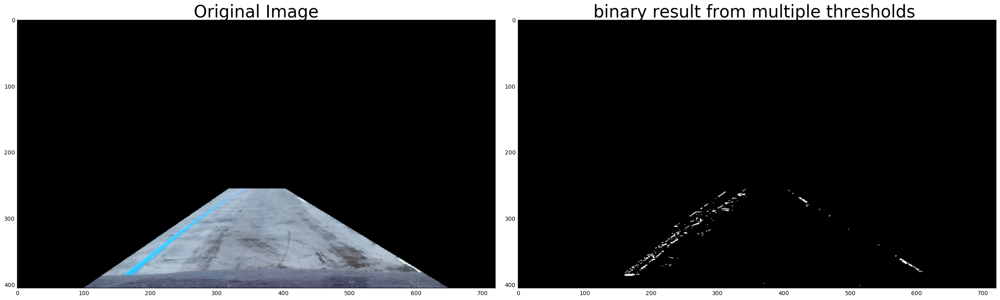

In [16]:
#image = cv2.resize(image,(720,405))
#gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements
     
# Apply each of the thresholding functions
gradx = abs_sobel_thresh(img_masked, orient='x', sobel_kernel=ksize, thresh=(10,90))
grady = abs_sobel_thresh(img_masked, orient='y', sobel_kernel=ksize, thresh=(10,90))
mag_binary = mag_thresh(img_masked, sobel_kernel=ksize, mag_thresh=(80,255))
dir_binary = dir_threshold(img_masked, sobel_kernel=ksize, thresh=(0.7, 1.3))
hls_binary = HLS_single(img_masked, thresh=(70, 255))
combined = np.zeros_like(dir_binary)
#combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
combined[((grady == 1) & (grady == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1) & (hls_binary == 1))] = 1
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_masked)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(combined, cmap='gray')
ax2.set_title('binary result from multiple thresholds ', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [17]:
def perspective_transform(img, M):
    warped = cv2.warpPerspective(img, M, dsize = (img.shape[1],img.shape[0]), flags = cv2.INTER_LINEAR)
    return warped

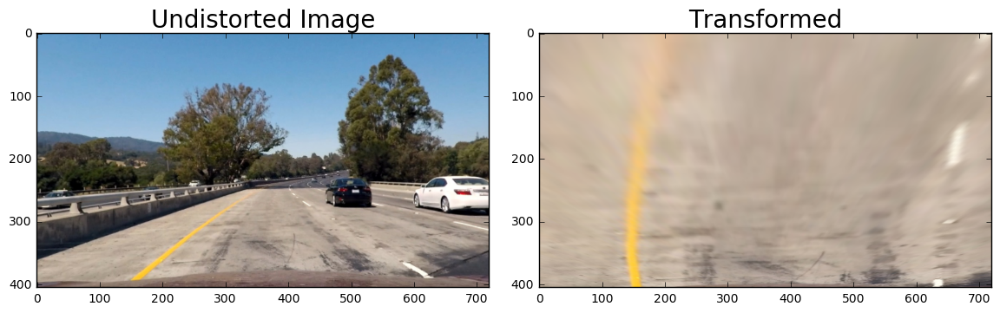

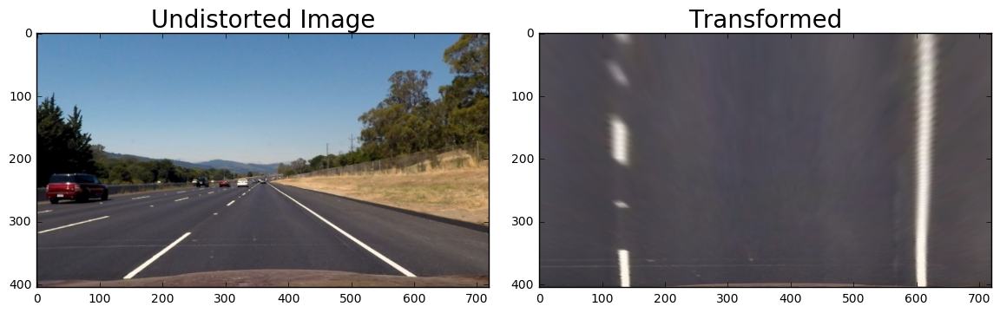

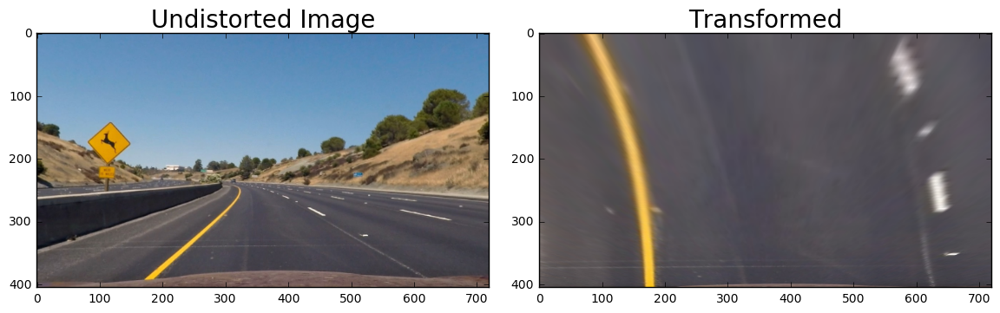

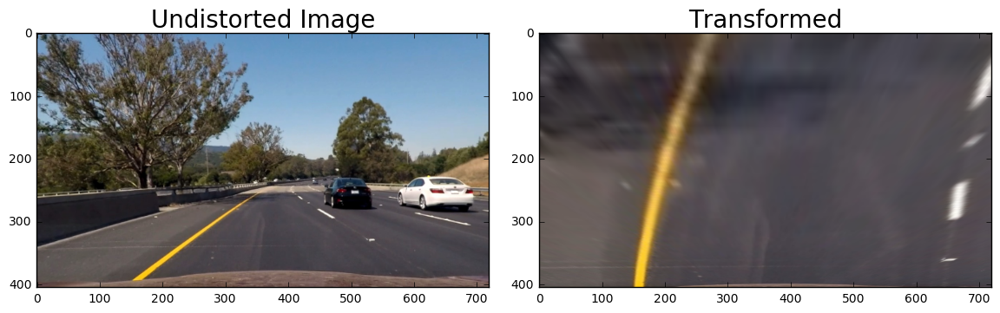

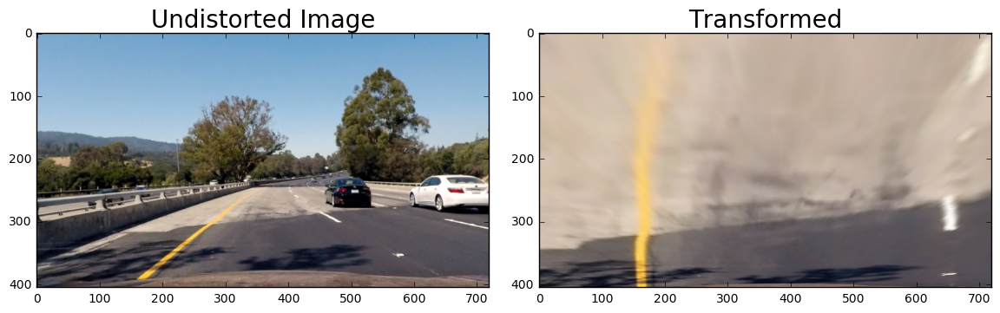

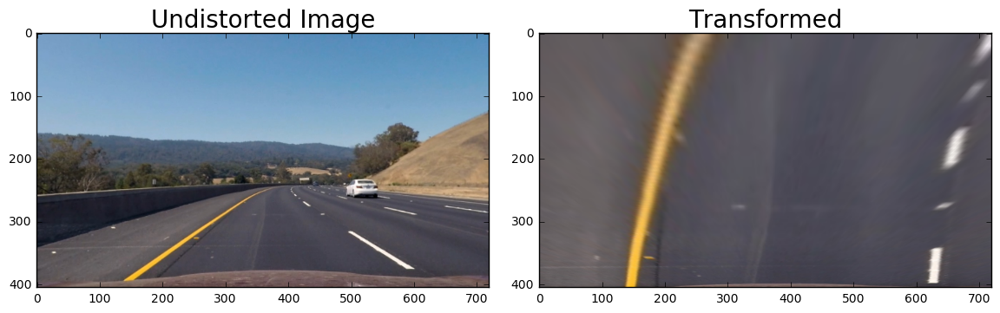

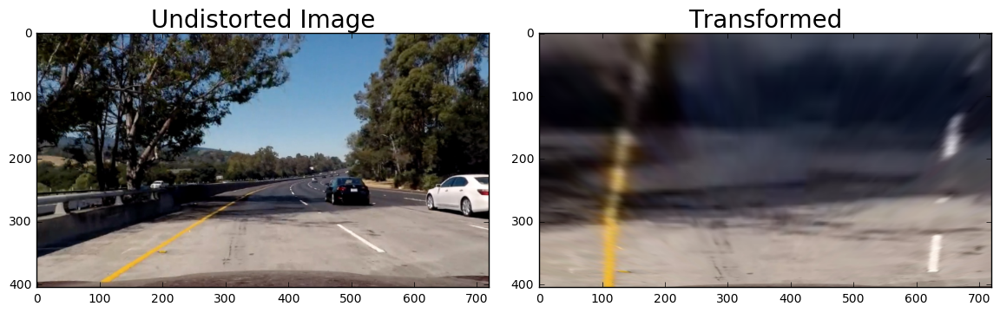

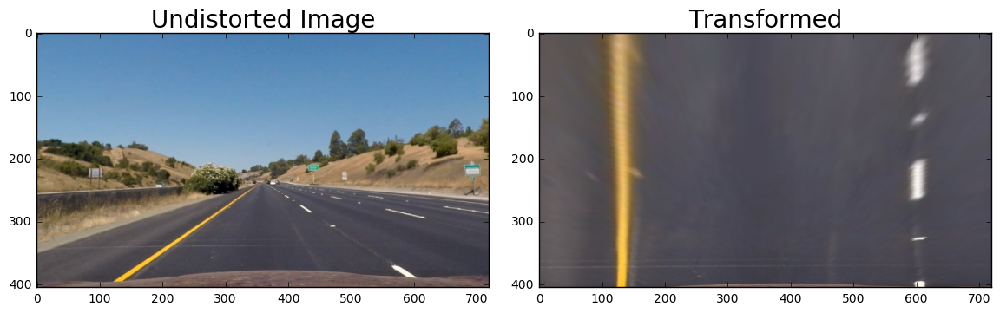

In [18]:
import os
apex, apey = 360, 258
offset_far = 50
offset_near = 10
src = np.float32([[int(apex-offset_far),apey],
                  [int(apex+offset_far),apey],
                  [int(0+offset_near),390],
                  [int(720-offset_near),390]])
dst = np.float32([[0,0],[720,0],[0,405],[720,405]])
M = cv2.getPerspectiveTransform(src, dst)

images = os.listdir('./test_images')  
for fname in images:
    fname = os.path.join('test_images',fname)
    img = mpimg.imread(fname)
    img = cv2.resize(img, (720, 405))
    img = cv2.undistort(img, mtx, dist, None, mtx)
    warped = perspective_transform(img, M)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Undistorted Image', fontsize=20)
    #ax2.imshow(combined)
    ax2.imshow(warped)
    ax2.set_title('Transformed', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    

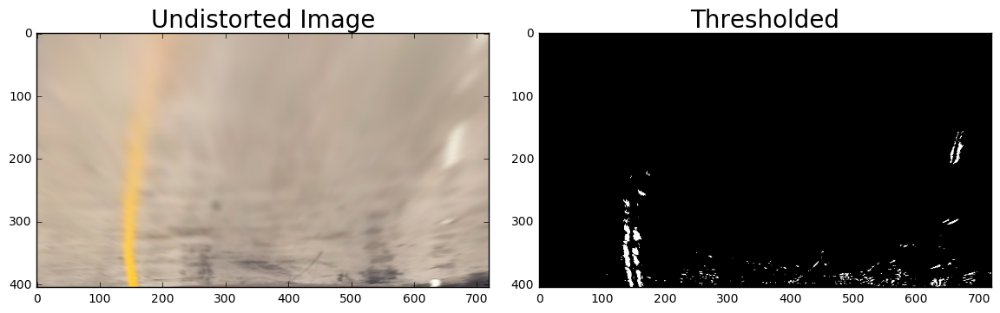

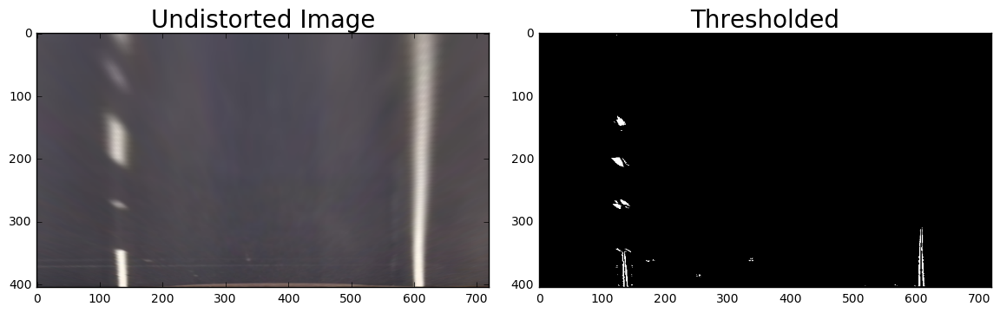

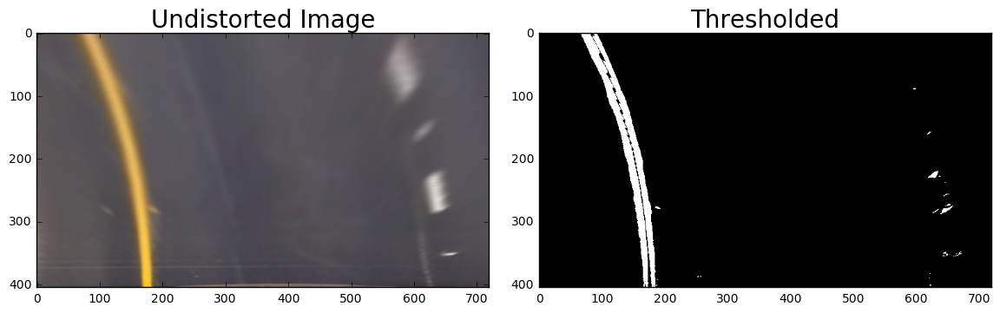

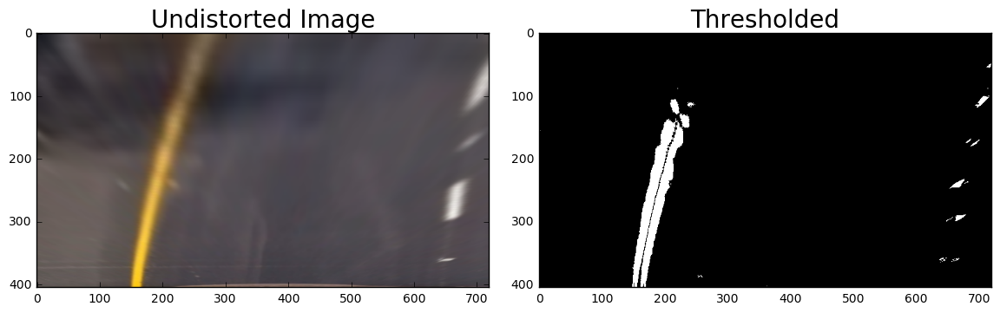

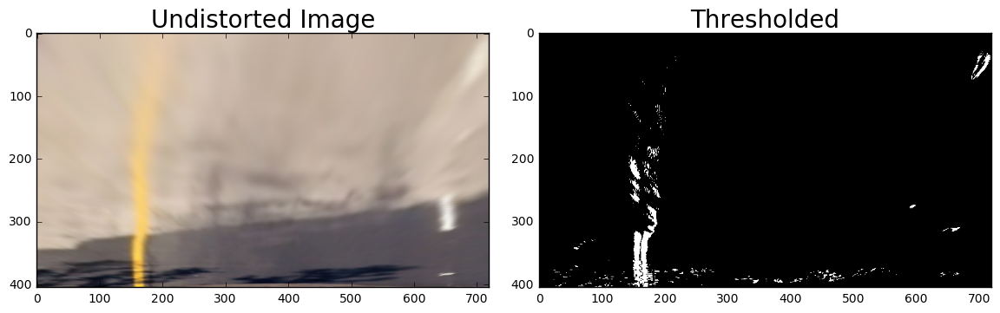

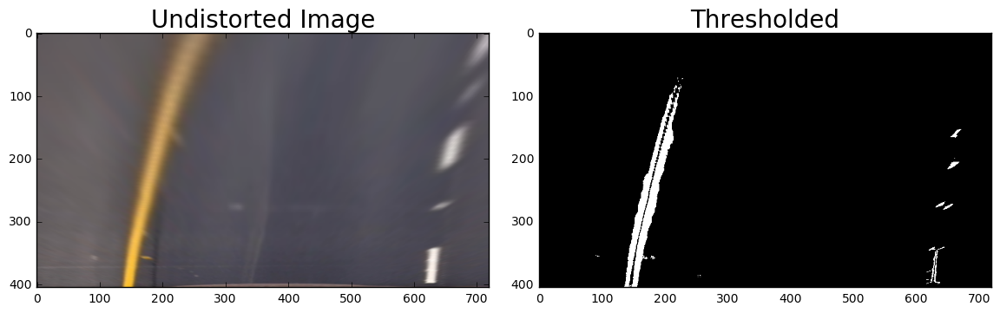

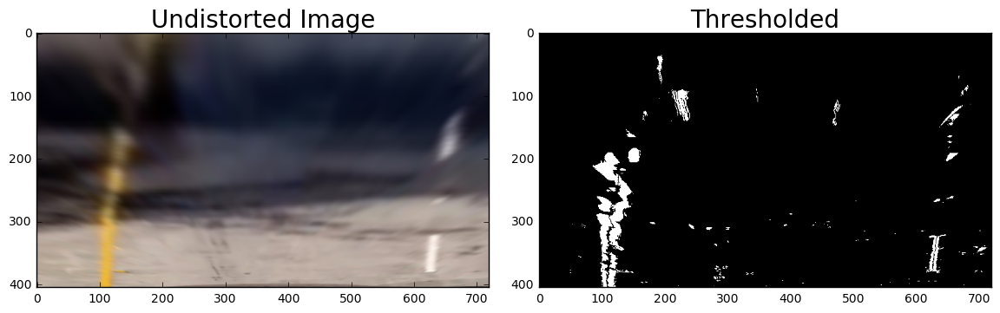

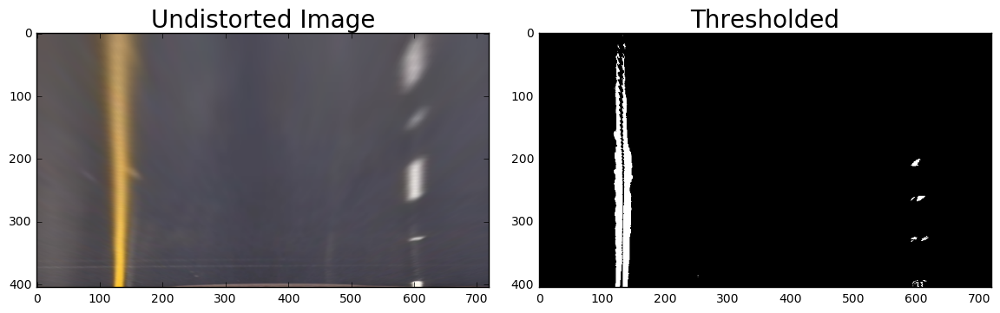

In [19]:
for fname in images:
    fname = os.path.join('test_images',fname)
    img = mpimg.imread(fname)
    img = cv2.resize(img, (720, 405))
    img = cv2.undistort(img, mtx, dist, None, mtx)
    img= cv2.GaussianBlur(img, (3,3), 0)
    warped = perspective_transform(img, M)
    gray = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
    gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=3, thresh=(10, 230))
    grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=3, thresh=(10, 230))
    mag_binary = mag_thresh(warped, sobel_kernel=ksize, mag_thresh=(30, 150))
    dir_binary = dir_threshold(warped, sobel_kernel=ksize, thresh=(0.7, 1.3))
    hls_binary = HLS_single(warped, thresh=(90, 255))
    combined = np.zeros_like(dir_binary)
    
    combined[((gradx == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    #combined[((gradx == 1) & (grady == 1) & hls_binary) | ((mag_binary == 1) & (dir_binary == 1))] = 1  
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
    f.tight_layout()
    ax1.imshow(warped)
    ax1.set_title('Undistorted Image', fontsize=20)
    ax2.imshow(combined,cmap='gray' )
    ax2.set_title('Thresholded', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

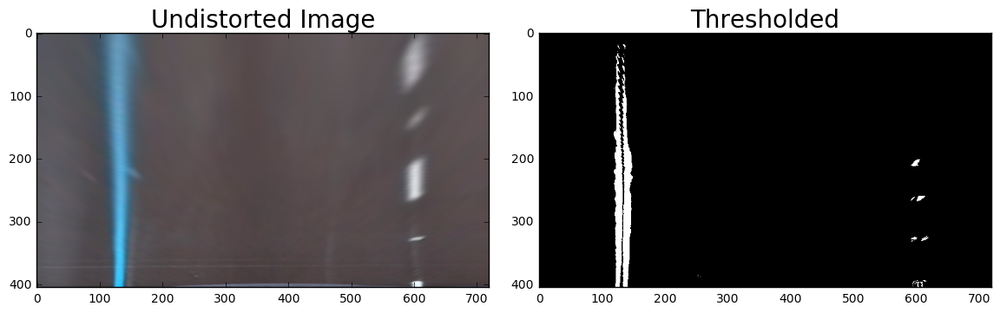

In [20]:
img = cv2.imread('test_images/straight_lines1.jpg')
img = cv2.resize(img, (720, 405))
img = cv2.undistort(img, mtx, dist, None, mtx)
img= cv2.GaussianBlur(img, (3,3), 0)
warped = perspective_transform(img, M)
gray = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=3, thresh=(10, 230))
grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=3, thresh=(10, 230))
mag_binary = mag_thresh(warped, sobel_kernel=ksize, mag_thresh=(30, 150))
dir_binary = dir_threshold(warped, sobel_kernel=ksize, thresh=(0.7, 1.3))
hls_binary = HLS_single(warped, thresh=(90, 255))
combined = np.zeros_like(dir_binary)
    
combined[((gradx == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    #combined[((gradx == 1) & (grady == 1) & hls_binary) | ((mag_binary == 1) & (dir_binary == 1))] = 1  
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(warped)
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(combined,cmap='gray' )
ax2.set_title('Thresholded', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [21]:
def gaussian_blur(img, kernel_size):
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

In [23]:
def find_center(img):
    # find_starting_point
    # get haff of the image
    img_half = img[int(img.shape[0]/2):,:]
    img_blur = gaussian_blur(img_half, 9) # blur it

    histogram = np.sum(img_half, axis=0)

    center = np.argmax(histogram[0:mid])
    val = np.max(histogram[0:mid])
    return center,val

In [89]:
# Perform perspective transform
def birds_eye(img, display=True, read = True):
    if read:
        undist = undistort(img, show = False)
    else:
        undist = undistort(img, show = False, read=False) 
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    src = np.float32([[490, 482],[810, 482],
                      [1250, 720],[40, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(undist, M, img_size)
    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 6))
        f.tight_layout()
        ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        ax1.set_title('Undistorted Image', fontsize=20)
        ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
        ax2.set_title('Undistorted and Warped Image', fontsize=20)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    else:
        return warped, M

In [100]:
# Create binary thresholded images to isolate lane line pixels
def apply_thresholds(image, show=True):

    s_channel = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2]
    
    l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:,:,0]

    b_channel = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)[:,:,2]   

    # Threshold color channel
    s_thresh_min = 180
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    b_thresh_min = 155
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1
    
    l_thresh_min = 225
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1

    #color_binary = np.dstack((u_binary, s_binary, l_binary))
    
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1

    if show == True:
        # Plotting thresholded images
        f, ((ax1, ax2, ax3), (ax4,ax5, ax6)) = plt.subplots(2, 3, sharey='col', sharex='row', figsize=(10,4))
        f.tight_layout()
        
        ax1.set_title('Original Image', fontsize=16)
        ax1.imshow(img)
        
        ax2.set_title('Warped Image', fontsize=16)
        ax2.imshow(warped)
        
        ax3.set_title('s binary threshold', fontsize=16)
        ax3.imshow(s_binary, cmap='gray')
        
        ax4.set_title('b binary threshold', fontsize=16)
        ax4.imshow(b_binary, cmap='gray')
        
        ax5.set_title('l binary threshold', fontsize=16)
        ax5.imshow(l_binary, cmap='gray')

        ax6.set_title('Combined color thresholds', fontsize=16)
        ax6.imshow(combined_binary, cmap='gray')
        
        
    else: 
        return combined_binary

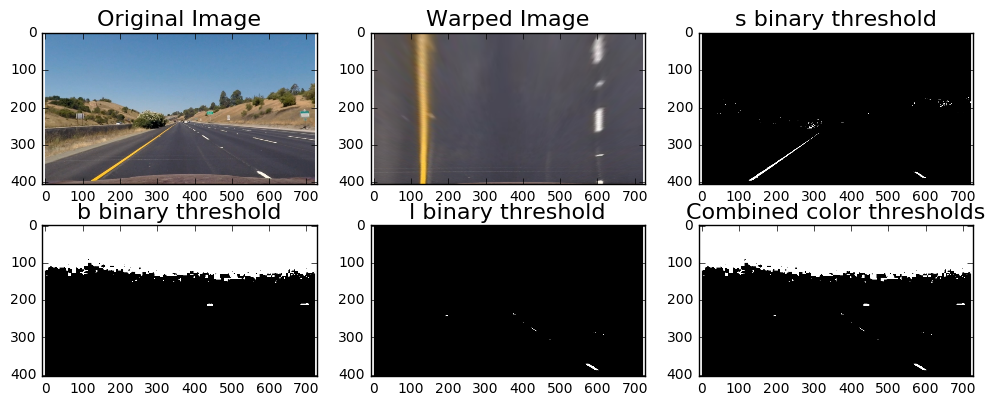

In [101]:
apply_thresholds(warped)

In [24]:
def fill_lane(image):
    
    combined_binary = apply_thresholds(image, show=False)
    
    rightx = []
    righty = []
    leftx = []
    lefty = []
    
    x, y = np.nonzero(np.transpose(combined_binary))
    i = 720
    j = 630
    while j >= 0:
        histogram = np.sum(combined_binary[j:i,:], axis=0)
        left_peak = np.argmax(histogram[:640])
        x_idx = np.where((((left_peak - 25) < x)&(x < (left_peak + 25))&((y > j) & (y < i))))
        x_window, y_window = x[x_idx], y[x_idx]
        if np.sum(x_window) != 0:
            leftx.extend(x_window.tolist())
            lefty.extend(y_window.tolist())

        right_peak = np.argmax(histogram[640:]) + 640
        x_idx = np.where((((right_peak - 25) < x)&(x < (right_peak + 25))&((y > j) & (y < i))))
        x_window, y_window = x[x_idx], y[x_idx]
        if np.sum(x_window) != 0:
            rightx.extend(x_window.tolist())
            righty.extend(y_window.tolist())
        i -= 90
        j -= 90

    lefty = np.array(lefty).astype(np.float32)
    leftx = np.array(leftx).astype(np.float32)
    righty = np.array(righty).astype(np.float32)
    rightx = np.array(rightx).astype(np.float32)
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    rightx_int = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    rightx = np.append(rightx,rightx_int)
    righty = np.append(righty, 720)
    rightx = np.append(rightx,right_fit[0]*0**2 + right_fit[1]*0 + right_fit[2])
    righty = np.append(righty, 0)
    leftx_int = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    leftx = np.append(leftx, leftx_int)
    lefty = np.append(lefty, 720)
    leftx = np.append(leftx,left_fit[0]*0**2 + left_fit[1]*0 + left_fit[2])
    lefty = np.append(lefty, 0)
    lsort = np.argsort(lefty)
    rsort = np.argsort(righty)
    lefty = lefty[lsort]
    leftx = leftx[lsort]
    righty = righty[rsort]
    rightx = rightx[rsort]
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    
    # Measure Radius of Curvature for each lane line
    ym_per_pix = 30./720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit_cr[0]*np.max(lefty) + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*np.max(lefty) + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])
    
    
    # Calculate the position of the vehicle
    center = abs(640 - ((rightx_int+leftx_int)/2))
    
    offset = 0 
    img_size = (img.shape[1], img.shape[0])
    src = np.float32([[490, 482],[810, 482],
                      [1250, 720],[40, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, lefty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, righty]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    newwarp = cv2.warpPerspective(color_warp, Minv, (combined_binary.shape[1], combined_binary.shape[0]))
    result = cv2.addWeighted(mpimg.imread(image), 1, newwarp, 0.5, 0)
    
    f, (ax1, ax2) = plt.subplots(1,2, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor((birds_eye(image, display=False)[0]), cv2.COLOR_BGR2RGB))
    ax1.set_xlim(0, 1280)
    ax1.set_ylim(0, 720)
    ax1.plot(left_fitx, lefty, color='green', linewidth=3)
    ax1.plot(right_fitx, righty, color='green', linewidth=3)
    ax1.set_title('Fit Polynomial to Lane Lines', fontsize=16)
    ax1.invert_yaxis() # to visualize as we do the images
    ax2.imshow(result)
    ax2.set_title('Fill Lane Between Polynomials', fontsize=16)
    if center < 640:
        ax2.text(200, 100, 'Vehicle is {:.2f}m left of center'.format(center*3.7/700),
                 style='italic', color='white', fontsize=10)
    else:
        ax2.text(200, 100, 'Vehicle is {:.2f}m right of center'.format(center*3.7/700),
                 style='italic', color='white', fontsize=10)
    ax2.text(200, 175, 'Radius of curvature is {}m'.format(int((left_curverad + right_curverad)/2)),
             style='italic', color='white', fontsize=10)

In [104]:
fill_lane(warped)

TypeError: Object does not appear to be a 8-bit string path or a Python file-like object

In [25]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def histogram_1(combined):
    # Assuming you have created a warped binary image called "combined"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(combined[combined.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((combined, combined, combined))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    #print(leftx_base, rightx_base)
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(combined.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = combined.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = combined.shape[0] - np.int((window+1)*window_height)
        win_y_high = combined.shape[0] - np.int(window*window_height)
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    return leftx, lefty, rightx, righty, out_img

In [26]:
leftx, lefty, rightx, righty, out_img = histogram_1(combined)

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

/home/octo/anaconda2/envs/SDC3/lib/python3.5/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


In [27]:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
def quick_lane_finder(img):
    nonzero = combined.nonzero()
    #print(nonzero)
    nonzeroy = np.array(nonzero[0])
    #print(nonzeroy)
    nonzerox = np.array(nonzero[1])
    #print(nonzerox)
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) \
                      & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) \
                       & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    #print(left_lane_inds)
    #print(right_lane_inds)
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    #print(leftx)
    lefty = nonzeroy[left_lane_inds]
    #print(lefty)
    rightx = nonzerox[right_lane_inds]
    #print(rightx)
    righty = nonzeroy[right_lane_inds]
    #print(righty)
    return leftx, lefty, rightx, righty

leftx, lefty, rightx, righty = quick_lane_finder(combined)
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, combined.shape[0]-1, combined.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

In [28]:
#from scipy import signal

def histogram(img):
    left_x = []
    left_y = []
    right_x = []
    right_y = []
    layers = 8
    lane_center = 130
    lane_dist = -400
    #pointer = int(img.shape[0]/layers)
    pointer = 0
    for bottom in range(layers):
        end = int(img.shape[0]/layers) 
        # produce histogram for each layer 
        #histogram = np.sum(img[pointer:pointer+end,:], axis=0)
        histogram_left = np.sum(img[pointer:pointer+end,0:int(img.shape[1]/2)], axis=0)
        histogram_right = np.sum(img[pointer:pointer+end,int(img.shape[1]/2):img.shape[1]], axis=0)
        # find the peaks in the histogram                            
        #peakind = signal.find_peaks_cwt(histogram, np.arange(1, 15))
        peak_left = np.mean(signal.find_peaks_cwt(histogram_left, np.arange(1, 15)))
        peak_right = np.mean(signal.find_peaks_cwt(histogram_right, np.arange(1, 15)))
        """                    
        if(len(peakind) > 0):
            for num in peakind:
                if num < img.shape[1]/2-lane_center:
                    if num > 80:
                        left_y.append(num)
                        left_x.append(pointer)
                if num > img.shape[1]/2+lane_center:
                    if num < 680:
                        right_y.append(num)
                        right_x.append(pointer)
        """
        if 70 < peak_left < img.shape[1]/2-lane_center:
            left_y.append(peak_left)
            left_x.append(pointer)
            
        if img.shape[1]/2+lane_center< peak_right+int(img.shape[1]/2) < 690:
            right_y.append(peak_right+int(img.shape[1]/2))
            right_x.append(pointer)
                
        pointer = pointer + int(img.shape[0]/layers)
                                
    return left_y, left_x, right_y, right_x

In [29]:
def find_3p_circle_radius(x1,y1,x2,y2,x3,y3):
    
    # source : http://www.intmath.com/applications-differentiation/8-radius-curvature.php
    m1 = (y2-y1)/(x2-x1)
    m2 = (y3-y2)/(x3-x2)
    
    xc = (m1*m2*(y1-y3)+m2*(x1+x2)-m1*(x2+x3))/(2*(m2-m1))
    yc = -(xc-(x1+x2)/2)/m1+(y1+y2)/2
    
    Radius = np.sqrt((x2-xc)*(x2-xc)+(y2-yc)*(y2-yc))
    
    return m1, m2, xc, yc, Radius


m1, m2, xc, yc, R = find_3p_circle_radius(1,1,2,3, 3,8)

#print (m1, m2, xc, yc, R)


In [32]:
def pipeline(img):
    img = cv2.resize(img, (720, 405))
    img = cv2.undistort(img, mtx, dist, None, mtx)
    warped = perspective_transform(img, M)
    gray = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
    gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=3, thresh=(10, 230))
    grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=3, thresh=(10, 230))
    mag_binary = mag_thresh(warped, sobel_kernel=ksize, mag_thresh=(30, 150))
    dir_binary = dir_threshold(warped, sobel_kernel=ksize, thresh=(0.7, 1.3))
    hls_binary = HLS_single(warped, thresh=(80, 255))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
          
    leftx, lefty, rightx, righty, out_img = histogram_1(combined)
        
    yvals = np.linspace(0, img.shape[0], num=img.shape[0])

    # Fit a second order polynomial to each lane line
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*yvals**2 + left_fit[1]*yvals + left_fit[2]
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*yvals**2 + right_fit[1]*yvals + right_fit[2]

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/405 # meters per pixel in y dimension
    xm_per_pix = 3.7/600 # meteres per pixel in x dimension
    # Define y-value where we want radius of curvature
    # I'll choose 3 y-values(max, mean and min):
    y_eval = np.max(yvals)
    
    y_eval1 = np.max(yvals)
    y_eval2 = np.mean(yvals)
    y_eval3 = np.min(yvals)
    left_fitx_1 = left_fit[0]*y_eval1**2 + left_fit[1]*yvals + left_fit[2]
    left_fitx_2 = left_fit[0]*y_eval2**2 + left_fit[1]*yvals + left_fit[2]
    left_fitx_3 = left_fit[0]*y_eval3**2 + left_fit[1]*yvals + left_fit[2]
    right_fitx_1 = right_fit[0]*y_eval1**2 + right_fit[1]*yvals + right_fit[2]
    right_fitx_2 = right_fit[0]*y_eval2**2 + right_fit[1]*yvals + right_fit[2]
    right_fitx_3 = right_fit[0]*y_eval3**2 + right_fit[1]*yvals + right_fit[2]
    
    
    # Calculated the turning center point xc, yc and radius: 
            
    lm1, lm2, lxc, lyc, lradius = find_3p_circle_radius(left_fitx_1,y_eval1,left_fitx_2,y_eval2,left_fitx_3,y_eval3,)
    l_steering_angle = 4*360/lxc # assume xc <> 0, xc and radius value is very close, xc will show the direction as well
    
    
    rm1, rm2, rxc, ryc, rradius = find_3p_circle_radius(right_fitx_1,y_eval1,right_fitx_2,y_eval2,right_fitx_3,y_eval3,)
     
    r_steering_angle = 4*360/rxc # assume xc <> 0, xc and radius value is very close, xc will show the direction as well
    steering_angle = l_steering_angle + r_steering_angle
    turning_radius = (lradius+rradius)/2 # smooth out the radius
    
    # Find camera position
    left_mean = np.mean(leftx)
    right_mean = np.mean(rightx)
    camera_pos = (combined.shape[1]/2)-np.mean([left_mean, right_mean])
    """
    # Draw left arc, 500 pixels on image
    lane_width = 500
    #if left lane detection output is stronger
    #left_arcx_pt = 120+lxc+np.sqrt(lradius**2-(405-yvals)**2)
    #right_arcx_pt = 120+lxc+np.sqrt((lradius+lane_width)**2-(405-yvals)**2)
    #if right lane detection output is stronger 
    #left_arcx_pt = left_mean+lane_width+rxc-np.sqrt((lane_width+radius)**2-(405-yvals)**2)
    right_arcx_pt = right_mean+lane_width+rxc-np.sqrt(radius**2-(405-yvals)**2)
    left_arcx_pt = right_arcx_pt -lane_width

    """
    left_fit_cr = np.polyfit(np.array(lefty,dtype=np.float32)*ym_per_pix, \
                         np.array(leftx,dtype=np.float32)*xm_per_pix, 2)
    right_fit_cr = np.polyfit(np.array(righty,dtype=np.float32)*ym_per_pix, \
                          np.array(rightx,dtype=np.float32)*xm_per_pix, 2)
    
    # Return radius of curvature is in meters
    
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval + left_fit_cr[1])**2)**1.5) \
                             /np.absolute(2*left_fit_cr[0])

    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval + right_fit_cr[1])**2)**1.5) \
                                /np.absolute(2*right_fit_cr[0])
      
    
    # Link all points for cv2.fillPoly() in pix space
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))
    #pts_left = np.array([np.transpose(np.vstack([left_arcx_pt, yvals]))])
    #pts_right = np.array([np.flipud(np.transpose(np.vstack([right_arcx_pt, yvals])))])
    #pts = np.hstack((pts_left, pts_right))
    # pts = np.array([pts], dtype=np.int32)
    
    # Draw the lane onto the warped blank image
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    #color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    cv2.fillPoly(warp_zero, np.int_([pts]), (0,255, 0))
    cv2.polylines(warp_zero, np.array([pts_left], dtype=np.int32), False,(255,0,0),thickness = 15)
    cv2.polylines(warp_zero, np.array([pts_right], dtype=np.int32), False,(0,0,255),thickness = 15)
    font = cv2.FONT_HERSHEY_COMPLEX_SMALL
    #cv2.putText(img,'Left curve' + ' ' + str(left_curverad)[:6] + 'm',(10,60), font, 1,(255,255,255),1)
    cv2.putText(img,'Camera Position' + ' ' + str(camera_pos*xm_per_pix)[:6] + 'm',(10,30), font, 1,(255,255,255),1)
    cv2.putText(img,'Turning Radius ' +str(turning_radius)[:6] + 'm' ,(10,60), font, 1,(255,255,255),1)
    cv2.putText(img,'Steering Angle '+'{:.6}'.format(str(steering_angle)) + ' deg',(10,90), font, 1,(255,255,255),1)
    
    # Warp back to original view
    unwarp = perspective_transform(warp_zero, Mi)
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, unwarp, 0.3, 0)
    #result = cv2.resize(result, (720, 405))

    return result

/home/octo/anaconda2/envs/SDC3/lib/python3.5/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


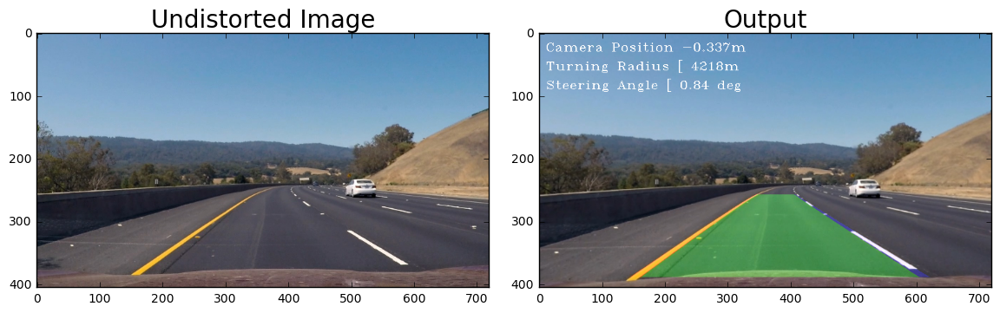

In [33]:
# Read in an image
image = mpimg.imread('test_images/test3.jpg')
image = cv2.resize(image,(720,405))

apex, apey = 360, 258
offset_far = 48
offset_near = 2
src = np.float32([[int(apex-offset_far),apey],
                  [int(apex+offset_far),apey],
                  [int(0+offset_near),390],
                  [int(720-offset_near),390]])
dst = np.float32([[0,0],[720,0],[0,405],[720,405]])
M = cv2.getPerspectiveTransform(src, dst)
Mi = cv2.getPerspectiveTransform(dst, src)

result = pipeline(image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(result,cmap='gray' )
ax2.set_title('Output', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [34]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

write_output = 'project_video_out4.mp4'
clip1 = VideoFileClip("project_video.mp4")
write_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time write_clip.write_videofile(write_output, audio=False)

[MoviePy] >>>> Building video project_video_out4.mp4
[MoviePy] Writing video project_video_out4.mp4


100%|█████████▉| 1260/1261 [01:42<00:00, 11.73it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out4.mp4 

CPU times: user 5min 12s, sys: 2.38 s, total: 5min 15s
Wall time: 1min 42s


In [39]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

write_output = 'challenge_video_out3.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
write_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time write_clip.write_videofile(write_output, audio=False)

[MoviePy] >>>> Building video challenge_video_out3.mp4
[MoviePy] Writing video challenge_video_out3.mp4


100%|██████████| 485/485 [00:37<00:00, 12.77it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_out3.mp4 

CPU times: user 1min 58s, sys: 1.17 s, total: 1min 59s
Wall time: 38.2 s


In [40]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

write_output = 'harder_challenge_video_out1.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
write_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time write_clip.write_videofile(write_output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_out1.mp4
[MoviePy] Writing video harder_challenge_video_out1.mp4


100%|█████████▉| 1199/1200 [01:41<00:00, 11.74it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_out1.mp4 

CPU times: user 5min 6s, sys: 2.2 s, total: 5min 8s
Wall time: 1min 42s


(405, 0)

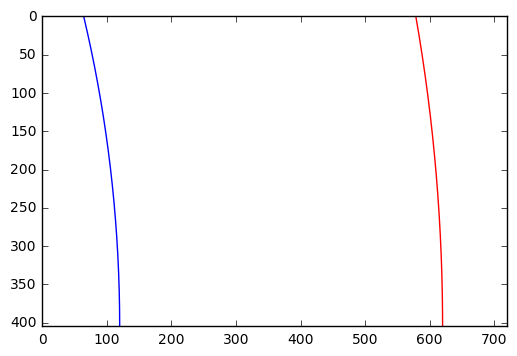

In [41]:
yvals = np.linspace(0, img.shape[0]-1, num=img.shape[0])
lxc = -1500
lradius = 1500
left_arcx = []
# Draw left arc, 500 pixels on image
lane_width = 500  
left_arcx_pt = 120+lxc+np.sqrt(lradius**2-(405-yvals)**2)
right_arcx_pt = 120+lxc+np.sqrt((lradius+lane_width)**2-(405-yvals)**2)
#    left_arcx.append(left_arcx_pt)

#print (left_arcx)
plt.plot(left_arcx_pt, yvals, color='blue')
plt.plot(right_arcx_pt, yvals, color='red')
plt.xlim(0, 720)
plt.ylim(405, 0)
#plt.ylim(0, 405

(405, 0)

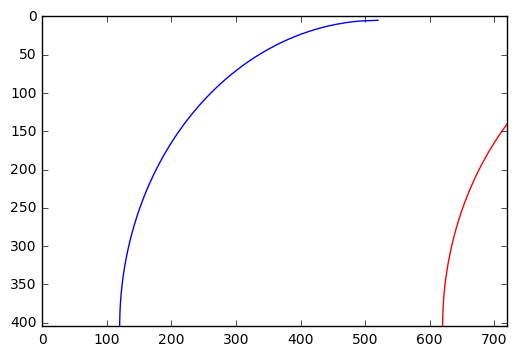

In [42]:
yvals = np.linspace(0, img.shape[0]-1, num=img.shape[0])
rxc = 400
radius = 400
# Draw left arc, 500 pixels on image
lane_width = 500  
#left_arcx_pt = 120+lane_width+rxc-np.sqrt((lane_width+radius)**2-(405-yvals)**2)

right_arcx_pt = 120+lane_width+rxc-np.sqrt(radius**2-(405-yvals)**2)
left_arcx_pt = right_arcx_pt -lane_width
#    left_arcx.append(left_arcx_pt)

#print (left_arcx)
plt.plot(left_arcx_pt, yvals, color='blue')
plt.plot(right_arcx_pt, yvals, color='red')
plt.xlim(0, 720)
plt.ylim(405, 0)